I wanted to compare the gradient term of robust training and nonrobust training.
So I have fixed epsilon to 0.2 in the doublebackTrainer and compute the loss term in every training.

# Plotting level sets

The goal is to plot the level set evolution for the neural ODEs with standard and robust training

In [1]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

import matplotlib.pyplot as plt
import numpy as np



# Juptyer magic: For export. Makes the plots size right for the screen 
%matplotlib inline
# %config InlineBackend.figure_format = 'retina'

%config InlineBackend.figure_formats = ['svg'] 


torch.backends.cudnn.deterministic = True
torch.manual_seed(2)
torch.cuda.manual_seed(2)

g = torch.Generator()
g.manual_seed(1)


# Data preparation

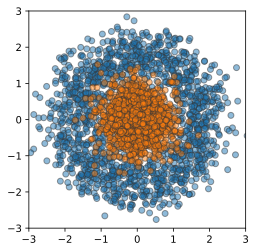

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons, make_circles, make_blobs
from sklearn.preprocessing import StandardScaler

from torch.utils import data as data
from torch.utils.data import DataLoader, TensorDataset

def create_dataloader(data_type, batch_size = 3000, noise = 0.15, factor = 0.15, random_state = 1, shuffle = False, plotlim = [-2, 2]):
    if data_type == 'circles':
        X, y = make_circles(batch_size, noise=noise, factor=factor, random_state=random_state, shuffle = shuffle)
        
        
    elif data_type == 'blobs':
        centers = [[-1, -1], [1, 1]]
        X, y = make_blobs(
    n_samples=batch_size, centers=centers, cluster_std=noise, random_state=0)
        
        
    elif data_type == 'moons':
        X, y = make_moons(batch_size, noise = noise, shuffle = shuffle , random_state = 0)
    
    
    elif data_type == 'xor':
        X = torch.randint(low=0, high=2, size=(batch_size, 2), dtype=torch.float32)
        y = np.logical_xor(X[:, 0] > 0, X[:, 1] > 0).float()
        # y = y.to(torch.int64)
        X += noise * torch.randn(X.shape)
        
        
    else: 
        print('datatype not supported')
        return None, None

    g = torch.Generator()
    g.manual_seed(random_state)
    
    X = StandardScaler().fit_transform(X)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.05 ) #random_state=2, shuffle = shuffle)

    X_train = torch.Tensor(X_train) # transform to torch tensor for dataloader
    y_train = torch.Tensor(y_train) #transform to torch tensor for dataloader

    X_test = torch.Tensor(X_test) # transform to torch tensor for dataloader
    y_test = torch.Tensor(y_test) #transform to torch tensor for dataloader

    X_train = X_train.type(torch.float32)  #type of orginial pickle.load data
    y_train = y_train.type(torch.int64) #dtype of original picle.load data

    X_test = X_test.type(torch.float32)  #type of orginial pickle.load data
    y_test = y_test.type(torch.int64) #dtype of original picle.load data


    train_data = TensorDataset(X_train,y_train) # create your datset
    test_data = TensorDataset(X_test, y_test)

    train = DataLoader(train_data, batch_size=64, shuffle=shuffle, generator=g)
    test = DataLoader(test_data, batch_size=256, shuffle=shuffle, generator = g) #128 before
    
    data_0 = X_train[y_train == 0]
    data_1 = X_train[y_train == 1]
    fig = plt.figure()
    plt.scatter(data_0[:, 0], data_0[:, 1], edgecolor="#333",  alpha = 0.5) #color = 'crimson',
    plt.scatter(data_1[:, 0], data_1[:, 1], edgecolor="#333", alpha = 0.5) #color = 'dodgerblue'
    plt.xlim(plotlim)
    plt.ylim(plotlim)
    ax = plt.gca()
    ax.set_aspect('equal')
    plt.savefig('trainingset.png', bbox_inches='tight', dpi=300, format='png', facecolor = 'white')
    plt.show()
    
    return train, test


data_noise = 0.25
plotlim = [-3, 3]
dataloader, dataloader_viz = create_dataloader('circles', noise = data_noise, plotlim = plotlim)



#Visualizing the data


In [3]:
#We can now conveniently access the data from the dataloaders
for X_test, y_test in dataloader_viz:
    print(X_test[:10], y_test[:10])
    break
    

tensor([[ 0.3475, -1.5674],
        [-0.3880, -0.1372],
        [ 0.4888, -1.5127],
        [ 0.0855,  0.4989],
        [ 0.0820,  0.0251],
        [-0.4618, -1.3879],
        [ 2.0553, -0.0330],
        [ 0.9527,  0.3159],
        [-0.0188, -0.5817],
        [ 0.2143,  0.0679]]) tensor([0, 1, 0, 1, 1, 0, 0, 1, 1, 1])


# Model dynamics

In [4]:
#Import of the model dynamics that describe the neural ODE
#The dynamics are based on the torchdiffeq package, that implements ODE solvers in the pytorch setting
from models.neural_odes import NeuralODE

#for neural ODE based networks the network width is constant. In this example the input is 2 dimensional
hidden_dim, data_dim = 2, 2 
augment_dim = 0

#T is the end time of the neural ODE evolution, num_steps are the amount of discretization steps for the ODE solver
T, num_steps = 20, 20 
bound = 0.
fp = False #this recent change made things not work anymore
cross_entropy = True
turnpike = False


non_linearity = 'tanh' #'relu' #
architecture = 'inside' #outside



torch.manual_seed(2)
torch.cuda.manual_seed(2)
anode = NeuralODE(device, data_dim, hidden_dim, augment_dim=augment_dim, non_linearity=non_linearity, 
                    architecture=architecture, T=T, time_steps=num_steps, fixed_projector=fp, cross_entropy=cross_entropy)
optimizer_anode = torch.optim.Adam(anode.parameters(), lr=1e-3) 


print(anode)

    


NeuralODE(
  (flow): Semiflow(
    (dynamics): Dynamics(
      (non_linearity): Tanh()
      (fc2_time): Sequential(
        (0): Linear(in_features=2, out_features=2, bias=True)
        (1): Linear(in_features=2, out_features=2, bias=True)
        (2): Linear(in_features=2, out_features=2, bias=True)
        (3): Linear(in_features=2, out_features=2, bias=True)
        (4): Linear(in_features=2, out_features=2, bias=True)
        (5): Linear(in_features=2, out_features=2, bias=True)
        (6): Linear(in_features=2, out_features=2, bias=True)
        (7): Linear(in_features=2, out_features=2, bias=True)
        (8): Linear(in_features=2, out_features=2, bias=True)
        (9): Linear(in_features=2, out_features=2, bias=True)
        (10): Linear(in_features=2, out_features=2, bias=True)
        (11): Linear(in_features=2, out_features=2, bias=True)
        (12): Linear(in_features=2, out_features=2, bias=True)
        (13): Linear(in_features=2, out_features=2, bias=True)
        (14

In [5]:
torch.manual_seed(2)
torch.cuda.manual_seed(2)
rnode = NeuralODE(device, data_dim, hidden_dim, augment_dim=0, non_linearity=non_linearity, 
                    architecture=architecture, T=T, time_steps=num_steps, fixed_projector=fp, cross_entropy=cross_entropy)
optimizer_rnode = torch.optim.Adam(rnode.parameters(), lr=1e-3) 


print(rnode)

NeuralODE(
  (flow): Semiflow(
    (dynamics): Dynamics(
      (non_linearity): Tanh()
      (fc2_time): Sequential(
        (0): Linear(in_features=2, out_features=2, bias=True)
        (1): Linear(in_features=2, out_features=2, bias=True)
        (2): Linear(in_features=2, out_features=2, bias=True)
        (3): Linear(in_features=2, out_features=2, bias=True)
        (4): Linear(in_features=2, out_features=2, bias=True)
        (5): Linear(in_features=2, out_features=2, bias=True)
        (6): Linear(in_features=2, out_features=2, bias=True)
        (7): Linear(in_features=2, out_features=2, bias=True)
        (8): Linear(in_features=2, out_features=2, bias=True)
        (9): Linear(in_features=2, out_features=2, bias=True)
        (10): Linear(in_features=2, out_features=2, bias=True)
        (11): Linear(in_features=2, out_features=2, bias=True)
        (12): Linear(in_features=2, out_features=2, bias=True)
        (13): Linear(in_features=2, out_features=2, bias=True)
        (14

# Training

In [6]:
from models.training import Trainer, doublebackTrainer

num_epochs = 130 #number of optimization runs in which the dataset is used for gradient decent
rob_eps = 0.2 #Set robust training parameter in order to compare standard training to robuts training (and logging the gradient term in both cases)


trainer_anode = doublebackTrainer(anode, optimizer_anode, device, cross_entropy=cross_entropy, turnpike = turnpike,
                         bound=bound, fixed_projector=fp, verbose = True, eps = 0, eps_comp = rob_eps) 

trainer_anode.train(dataloader, num_epochs)

0.2

Epoch 0/45
Loss: 0.946
Robust Term Loss: 0.113
Accuracy: 0.453

Epoch 10/45
Loss: 0.931
Robust Term Loss: 0.097
Accuracy: 0.406

Epoch 20/45
Loss: 0.779
Robust Term Loss: 0.045
Accuracy: 0.469

Epoch 30/45
Loss: 0.732
Robust Term Loss: 0.026
Accuracy: 0.516

Epoch 40/45
Loss: 0.770
Robust Term Loss: 0.026
Accuracy: 0.391
Epoch 1: 0.812
0.2

Epoch 0/45
Loss: 0.727
Robust Term Loss: 0.025
Accuracy: 0.469

Epoch 10/45
Loss: 0.748
Robust Term Loss: 0.031
Accuracy: 0.453

Epoch 20/45
Loss: 0.706
Robust Term Loss: 0.027
Accuracy: 0.500

Epoch 30/45
Loss: 0.686
Robust Term Loss: 0.020
Accuracy: 0.516

Epoch 40/45
Loss: 0.705
Robust Term Loss: 0.025
Accuracy: 0.484
Epoch 2: 0.710
0.2

Epoch 0/45
Loss: 0.688
Robust Term Loss: 0.019
Accuracy: 0.516

Epoch 10/45
Loss: 0.694
Robust Term Loss: 0.027
Accuracy: 0.469

Epoch 20/45
Loss: 0.657
Robust Term Loss: 0.028
Accuracy: 0.500

Epoch 30/45
Loss: 0.653
Robust Term Loss: 0.022
Accuracy: 0.516

Epoch 40/45
Loss: 0.659
Robust Term Loss: 0.027
Ac

In [7]:
from models.training import doublebackTrainer

# num_epochs = 120 #number of optimization runs in which the dataset is used for gradient decent
trainer_rnode = doublebackTrainer(rnode, optimizer_rnode, device, cross_entropy=cross_entropy, turnpike = turnpike,
                         bound=bound, fixed_projector=fp, verbose = True, eps = rob_eps) 

trainer_rnode.train(dataloader, num_epochs)

0.2

Epoch 0/45
Loss: 0.870
Robust Term Loss: 0.113
Accuracy: 0.453

Epoch 10/45
Loss: 0.837
Robust Term Loss: 0.095
Accuracy: 0.422

Epoch 20/45
Loss: 0.665
Robust Term Loss: 0.044
Accuracy: 0.469

Epoch 30/45
Loss: 0.609
Robust Term Loss: 0.025
Accuracy: 0.516

Epoch 40/45
Loss: 0.640
Robust Term Loss: 0.025
Accuracy: 0.422
Epoch 1: 0.702
0.2

Epoch 0/45
Loss: 0.606
Robust Term Loss: 0.023
Accuracy: 0.500

Epoch 10/45
Loss: 0.621
Robust Term Loss: 0.022
Accuracy: 0.469

Epoch 20/45
Loss: 0.593
Robust Term Loss: 0.022
Accuracy: 0.500

Epoch 30/45
Loss: 0.571
Robust Term Loss: 0.015
Accuracy: 0.516

Epoch 40/45
Loss: 0.591
Robust Term Loss: 0.019
Accuracy: 0.484
Epoch 2: 0.592
0.2

Epoch 0/45
Loss: 0.572
Robust Term Loss: 0.013
Accuracy: 0.516

Epoch 10/45
Loss: 0.578
Robust Term Loss: 0.014
Accuracy: 0.469

Epoch 20/45
Loss: 0.559
Robust Term Loss: 0.016
Accuracy: 0.500

Epoch 30/45
Loss: 0.550
Robust Term Loss: 0.013
Accuracy: 0.516

Epoch 40/45
Loss: 0.561
Robust Term Loss: 0.015
Ac

In [8]:
   
w = anode.linear_layer.weight
b = anode.linear_layer.bias

print(w)
print(b)

wr = rnode.linear_layer.weight
br = rnode.linear_layer.bias

print(wr)
print(b)

Parameter containing:
tensor([[ 1.2127,  1.1961],
        [-1.3098, -0.3511]], requires_grad=True)
Parameter containing:
tensor([ 0.0973, -0.1379], requires_grad=True)
Parameter containing:
tensor([[ 0.9611,  0.3571],
        [-1.0583,  0.4879]], requires_grad=True)
Parameter containing:
tensor([ 0.0973, -0.1379], requires_grad=True)


# Plotting Level Sets

Observe that the blue and red data points are getting seperated further as time passes.

In [9]:
import seaborn as sns
from matplotlib.colors import to_rgba, to_rgb
import numpy as np
import torch.nn as nn

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

@torch.no_grad()
def classification_evolution(model, data, label, grad = None, fig_name=None, footnote=None, contour = True, plotlim = [-2, 2], layer = -1):
    
    
    x1lower, x1upper = plotlim
    x2lower, x2upper = plotlim

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    if isinstance(data, torch.Tensor):
        data = data.cpu().numpy()
    if isinstance(label, torch.Tensor):
        label = label.cpu().numpy()
    data_0 = data[label == 0]
    data_1 = data[label == 1]

    fig = plt.figure(figsize=(5, 5), dpi=300)
    # plt.scatter(data_0[:, 0], data_0[:, 1], edgecolor="#333", label="Class 0", zorder = 1)
    # plt.scatter(data_1[:, 0], data_1[:, 1], edgecolor="#333", label="Class 1", zorder = 1)

    plt.ylabel(r"$x_2$")
    plt.xlabel(r"$x_1$")
    plt.figtext(0.5, 0, footnote, ha="center", fontsize=10)
    # plt.legend()
    if grad is not None:
        for i in range(len(data[:, 0])):
            plt.arrow(data[i, 0], data[i, 1], grad[i, 0], grad[i, 1],
                    head_width=0.05, head_length=0.1, fc='k', ec='k', alpha=0.5)

   
    model.to(device)

    x1 = torch.arange(x1lower, x1upper, step=0.01, device=device)
    x2 = torch.arange(x2lower, x2upper, step=0.01, device=device)
    xx1, xx2 = torch.meshgrid(x1, x2)  # Meshgrid function as in numpy
    model_inputs = torch.stack([xx1, xx2], dim=-1)
    
    
    _, proj_traj = model(model_inputs)
    
        
    preds = proj_traj[layer,:,:]
    # dim = 2 means that it normalizes along the last dimension, i.e. along the two predictions that are the model output
    m = nn.Softmax(dim=2)
    # softmax normalizes the model predictions to probabilities
    preds = m(preds)

    #we only need the probability for being in class1 (as prob for class2 is then 1- class1)
    preds = preds[:, :, 0]
    preds = preds.unsqueeze(2)  # adds a tensor dimension at position 2
    
    plt.grid(False)
    plt.xlim([x1lower, x1upper])
    plt.ylim([x2lower, x2upper])

    if contour:
        colors = [to_rgb("C1"), [1, 1, 1], to_rgb("C0")] # first color is orange, last is blue
        cm = LinearSegmentedColormap.from_list(
            "Custom", colors, N=40)
        z = np.array(preds).reshape(xx1.shape)
        
        plt.contourf(xx1, xx2, z, alpha=1, cmap=cm, zorder = 0, extent=(x1lower, x1upper, x2lower, x2upper)) #plt.get_cmap('coolwarm')
        

    if fig_name:
        plt.savefig(fig_name + '.png', bbox_inches='tight', dpi=300, format='png', facecolor = 'white')
        plt.clf()
        plt.close()
    # return fig

In [10]:
def comparison_plot(fig1, title1, fig2, title2, output_file, fig_size = 10, show = False):
    plt.figure(dpi = 300, figsize=(fig_size, fig_size))
    plt.subplot(121)
    sub1 = imageio.imread(fig1)
    plt.imshow(sub1)
    plt.title(title1)
    plt.axis('off')

    plt.subplot(122)
    sub2 = imageio.imread(fig2)
    plt.imshow(sub2)
    plt.title(title2)
    plt.axis('off')
    plt.savefig(output_file, bbox_inches='tight', dpi=600, format='png', facecolor = 'white')
    if show: plt.show()
    else:
        plt.gca()
        plt.close()

In [11]:
import imageio
import os
fig_name_base = 'levelsets'
fig_name = fig_name_base + '.png'
gif_name = fig_name_base + '_comp.gif'

fig_name_base_rob = fig_name_base + '_rob'
fig_name_rob = fig_name_base_rob + '.png'


for X_viz, y_viz in dataloader_viz:
    imgs = []
    for layer in torch.arange(num_steps):
        classification_evolution(anode, X_viz, y_viz, fig_name = fig_name_base, layer = layer, plotlim = plotlim)
        # imgs.append(imageio.imread(fig_name))
        classification_evolution(rnode, X_viz, y_viz, fig_name = fig_name_base_rob, layer = layer, plotlim = plotlim)
        
        comparison_plot(fig_name, 'standard training', fig_name_rob, 'robust training', 'levelsets_comp.png')
        print(layer, ' plotted')
        
        # plt.figure(dpi = 600)
        # plt.subplot(121)
        # levelsets = imageio.imread(fig_name)
        # plt.imshow(levelsets)
        # plt.title('Standard Training')
        # plt.axis('off')

        # plt.subplot(122)
        # levelsets_rob = imageio.imread(fig_name_rob)
        # plt.imshow(levelsets_rob)
        # plt.title('Robust Training')
        # plt.axis('off')
        # plt.savefig('levelsets_comp.png', bbox_inches='tight', dpi=300, format='png', facecolor = 'white')
        # plt.clf()
        # plt.close()
        
        imgs.append(imageio.imread('levelsets_comp.png'))
        # if not (num_steps == layer + 1): os.remove(fig_name_rob) #keep last image
    imageio.mimwrite(gif_name, imgs, fps = 1)
    # visualize_classification(rnode, X_viz, y_viz, fig_name = 'class_test1')
    break

c:\ProgramData\Anaconda3\lib\site-packages\torch\functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\TensorShape.cpp:2895.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


tensor(0)  plotted
tensor(1)  plotted
tensor(2)  plotted
tensor(3)  plotted
tensor(4)  plotted
tensor(5)  plotted
tensor(6)  plotted
tensor(7)  plotted
tensor(8)  plotted
tensor(9)  plotted
tensor(10)  plotted
tensor(11)  plotted
tensor(12)  plotted
tensor(13)  plotted
tensor(14)  plotted
tensor(15)  plotted
tensor(16)  plotted
tensor(17)  plotted
tensor(18)  plotted
tensor(19)  plotted


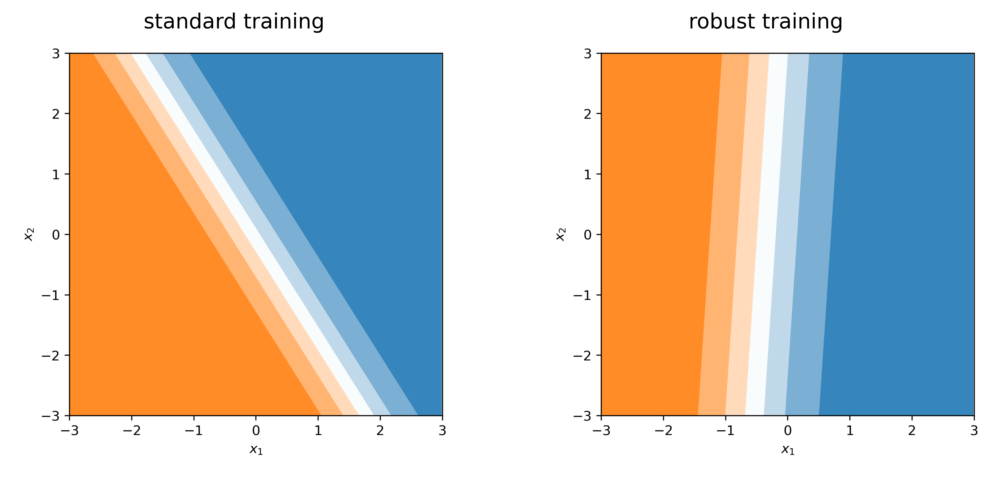

In [12]:
from IPython.display import Image
Image(filename="levelsets_comp.gif",  width = 800)

In [13]:
import imageio

plt.figure(dpi = 600, figsize = (10,30))

plt.subplot(131)
levelsets_rob = imageio.imread('trainingset.png')
plt.imshow(levelsets_rob)
plt.title('Training Data')
plt.axis('off')

plt.subplot(132)
levelsets = imageio.imread('levelsets.png')
plt.imshow(levelsets)
plt.title('Standard Training')
plt.axis('off')

plt.subplot(133)
levelsets_rob = imageio.imread('levelsets_rob.png')
plt.imshow(levelsets_rob)
plt.title('Robust Training')
plt.axis('off')

plt.savefig('levelset_comp.png', bbox_inches='tight', dpi=600, format='png', facecolor = 'white')
plt.show()

## Loss

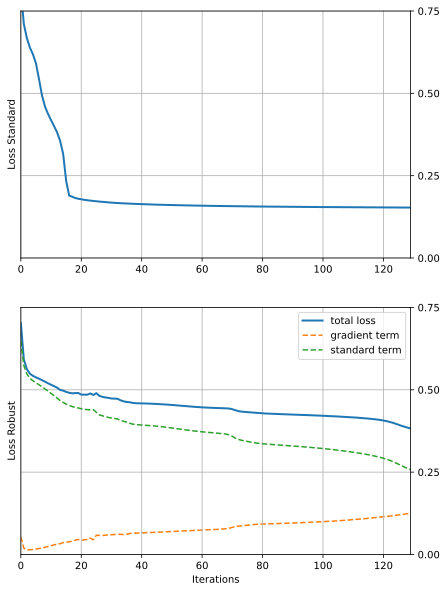

In [14]:
plt.figure(dpi = 300, figsize = (7,10))
labelsize = 10

plt.subplot(211)
plt.plot(trainer_anode.histories['epoch_loss_history'], linewidth = 2)
# plt.plot(trainer_anode.histories['epoch_loss_rob_history'], zorder = -1, linewidth = 1)
plt.xlim(0, len(trainer_anode.histories['epoch_loss_history']) - 1)
plt.ylim([0,0.75])

plt.yticks(np.arange(0,1,0.25))
plt.grid()
ax = plt.gca()
ax.yaxis.tick_right()
# ax.set_aspect()
plt.ylabel('Loss Standard', size = labelsize)

plt.subplot(212)
plt.plot(trainer_rnode.histories['epoch_loss_history'], linewidth = 2)
plt.plot(trainer_rnode.histories['epoch_loss_rob_history'], '--', zorder = -1)
plt.plot([loss - rob for loss, rob in zip(trainer_rnode.histories['epoch_loss_history'],trainer_rnode.histories['epoch_loss_rob_history'])],'--')
plt.xlim(0, len(trainer_rnode.histories['epoch_loss_history']) - 1)
plt.ylim(0)
plt.xlabel('Iterations', size = labelsize)
plt.ylabel('Loss Robust', size = labelsize)
plt.legend(['total loss', 'gradient term', 'standard term'], prop= {'size': labelsize})
plt.yticks(np.arange(0,1,0.25))
ax = plt.gca()
ax.yaxis.tick_right()
plt.grid()

plt.savefig('loss_comp.png', bbox_inches='tight', dpi=300, format='png', facecolor = 'white')
plt.show()
# plt.clf()
# plt.close()




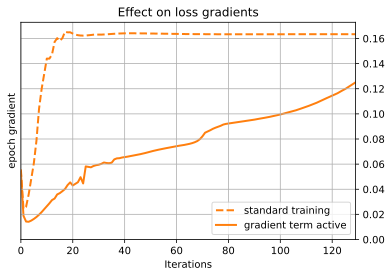

In [15]:
plt.plot(trainer_anode.histories['epoch_loss_rob_history'],'--', linewidth = 2, color = 'C1')
plt.title('Effect on loss gradients')
plt.plot(trainer_rnode.histories['epoch_loss_rob_history'], zorder = -1, linewidth = 2, color = 'C1')
plt.xlim(0, len(trainer_rnode.histories['epoch_loss_history']) - 1)
plt.ylim(0)
plt.xlabel('Iterations', size = labelsize)
plt.ylabel('epoch gradient', size = labelsize)
plt.legend(['standard training', 'gradient term active'], prop= {'size': labelsize})
# plt.yticks(np.arange(0,1.25,0.25))
ax = plt.gca()
ax.yaxis.tick_right()
plt.grid()

plt.savefig('loss_comp_grads.png', bbox_inches='tight', dpi=300, format='png', facecolor = 'white')
plt.show()


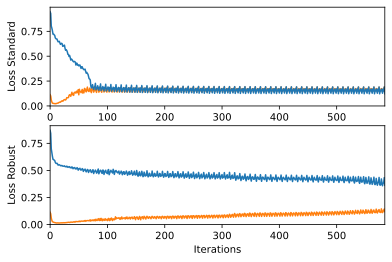

In [16]:
plt.figure(dpi = 300)
plt.subplot(211)
plt.plot(trainer_anode.histories['loss_history'])
plt.plot(trainer_anode.histories['loss_rob_history'], zorder = -1)
plt.xlim(0, len(trainer_anode.histories['loss_history']) - 1)
plt.ylim(0)
plt.xlabel('Iterations')
plt.ylabel('Loss Standard')

plt.subplot(212)
plt.plot(trainer_rnode.histories['loss_history'])
plt.plot(trainer_rnode.histories['loss_rob_history'], zorder = -1)
# plt.plot([loss - rob for loss, rob in zip(trainer_rnode.histories['epoch_loss_history'],trainer_rnode.histories['epoch_loss_rob_history'])])
plt.xlim(0, len(trainer_rnode.histories['loss_history']) - 1)
plt.ylim(0)
plt.xlabel('Iterations')
plt.ylabel('Loss Robust')
plt.savefig('loss_comp.png', bbox_inches='tight', dpi=600, format='png', facecolor = 'white')
plt.show()

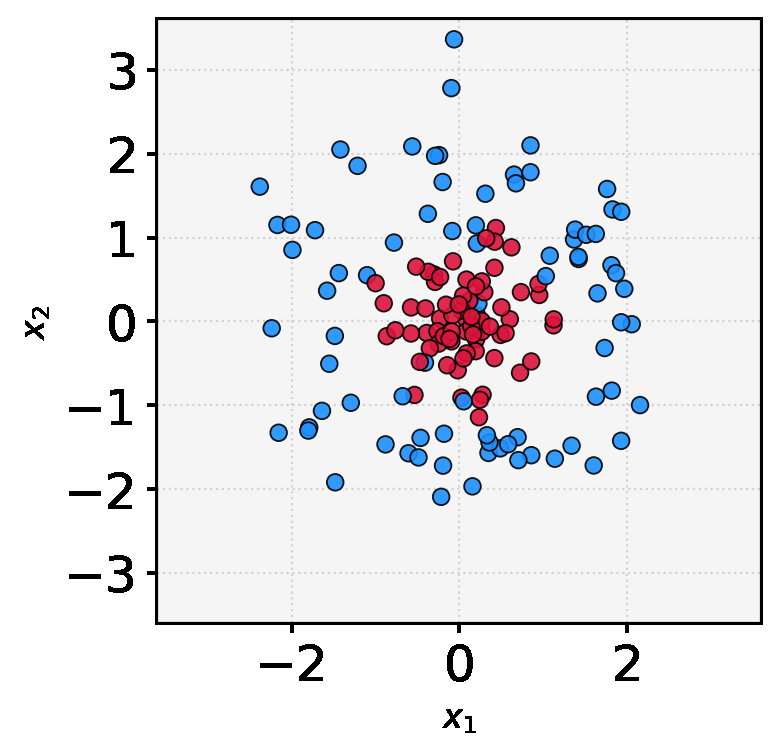

In [17]:
from plots.gifs import trajectory_gif

#the function trajectory_gif creates the evolution trajectories of the input data through the network
#the passing time corresponds to the depth of the network

for X_viz, y_viz in dataloader_viz:
    trajectory_gif(anode, X_viz, y_viz, timesteps=num_steps, filename = 'trajectory.gif')
    break

#Display of the generated gif

from IPython.display import Image
Image(filename="trajectory.gif", retina = True)

In [18]:
from plots.gifs import trajectory_gif

#the function trajectory_gif creates the evolution trajectories of the input data through the network
#the passing time corresponds to the depth of the network

for X_viz, y_viz in dataloader_viz:
    trajectory_gif(rnode, X_viz, y_viz, timesteps=num_steps, filename = 'trajectory_db.gif')
    break

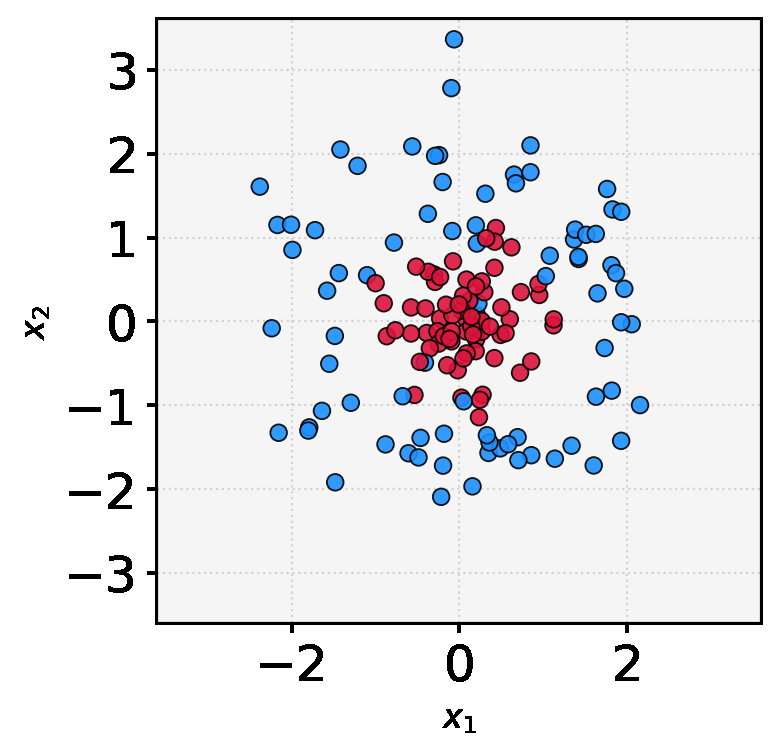

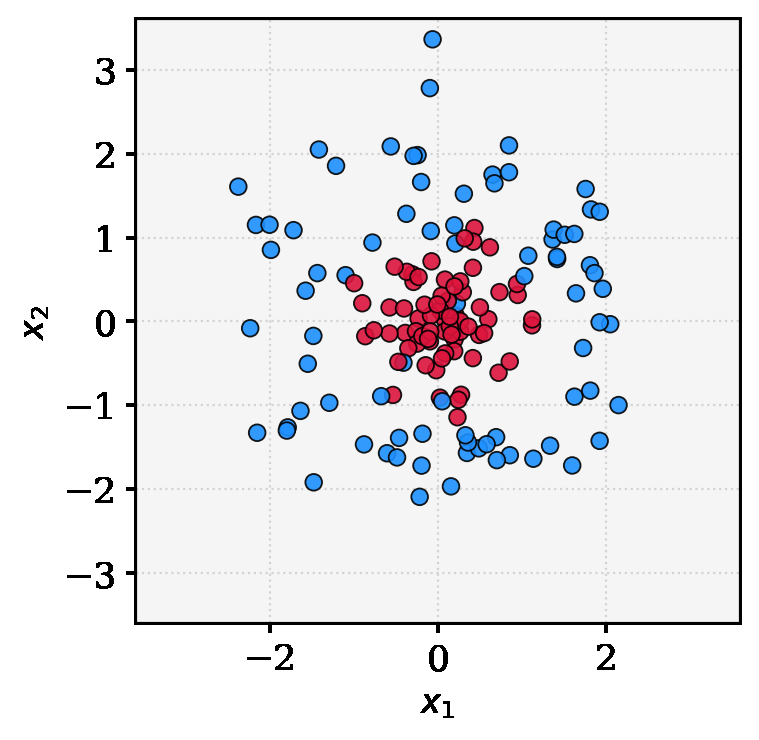

In [19]:
#Display of the generated gif

from IPython.display import Image
traj = Image(filename="trajectory.gif", retina = True)
rtraj = Image(filename="trajectory_db.gif", retina = True)
display(traj, rtraj)


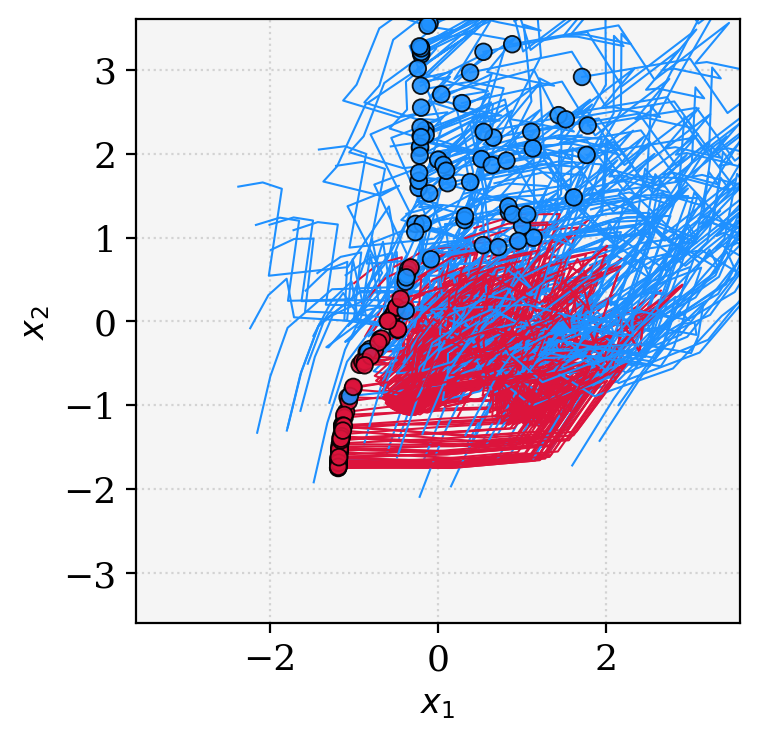

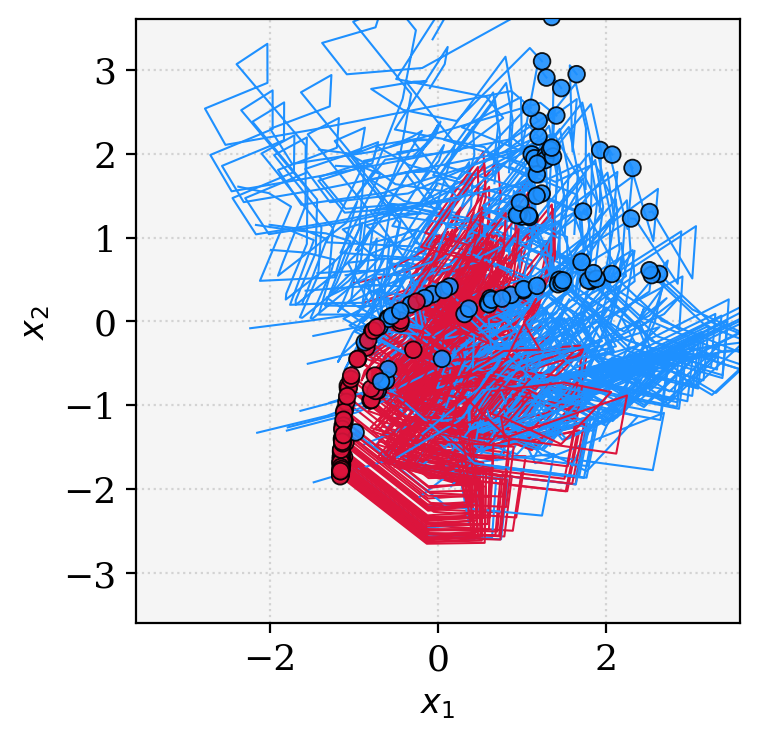

In [20]:
from IPython.display import Image
traj = Image(filename="trajectory19.png", retina = True)
rtraj = Image(filename="trajectory_db19.png", retina = True)
display(traj, rtraj)

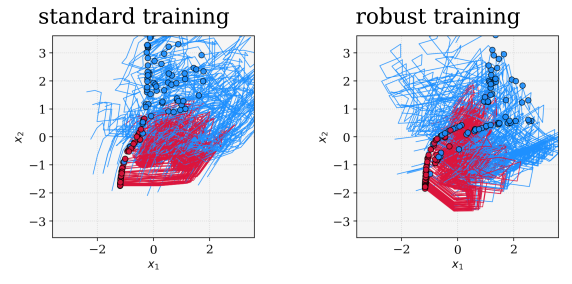

In [21]:
comparison_plot('trajectory19.png', 'standard training', 'trajectory_db19.png', 'robust training', 'traj_comp.png', show = True)
